## Estadística descriptiva respecto al volumen de datos
A continuación se procede a detallar mediante gráficos y tablas cómo está distribuida información relevante relacionada a los incidentes automovilísticos.

In [1]:
# Importacion de librerias que se emplearan
import pandas as pd
import numpy as np
from datetime import datetime
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import plotly.offline as pyo
import re

# Configuracion de pandas para que no bloque asignaciones masivas
pd.options.mode.chained_assignment = None

# Configuracion para que se muestren los graficos plotly en modo offline
pyo.init_notebook_mode()

# Se carga el dataset
df = pd.read_csv("../data_unida/Dataset_unido_imputado.csv")
df.head()

,X,Y,Anio,Comuna,Calle1,Calle2,Numero,Interseccion,Fallecidos,Graves,MenosGraves,Leves
0,-70.714761,-33.621957,2013,SAN BERNARDO,PRESIDENTE JORGE ALESSANDRI RODRIGUEZ,NaN,12489,0,1,0,0,0
1,-70.713433,-33.629206,2013,SAN BERNARDO,PRESIDENTE JORGE ALESSANDRI RODRIGUEZ,NaN,20040,0,0,0,0,1
2,-70.712113,-33.601339,2013,SAN BERNARDO,CALLE 1 DE MAYO,EYZAGUIRRE,0,1,0,0,0,1
3,-70.710571,-33.601829,2013,SAN BERNARDO,CALLE 1 DE MAYO,FIDEL PINOCHET,0,1,1,0,0,0
4,-70.707259,-33.636547,2013,SANTIAGO,PORTALES,NaN,3000,0,0,1,0,0


In [2]:
df.describe()

,X,Y,Anio,Numero,Interseccion,Fallecidos,Graves,MenosGraves,Leves
count,9239.000000,9239.000000,9239.000000,9239.000000,9239.000000,9239.000000,9239.000000,9239.000000,9239.000000
mean,-70.643993,-33.470311,2015.084316,1024.665224,0.728109,0.265938,0.426237,0.095681,1.485767
std,0.066069,0.070750,1.427747,2726.923291,0.444958,0.790148,0.787258,0.325608,1.712879
min,-70.921865,-33.648727,2013.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,-70.688593,-33.519193,2014.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,-70.643117,-33.454887,2015.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
75%,-70.591146,-33.424681,2016.000000,167.500000,1.000000,0.000000,1.000000,0.000000,2.000000
max,-70.482420,-33.088773,2017.000000,76771.000000,1.000000,3.000000,5.000000,3.000000,10.000000


In [3]:
print("===================================================================")
print("Tamaño del dataframe:")
print(df.shape)
print("===================================================================")
print("Tipo de variable de las columnas:")
print(df.dtypes)
print("===================================================================")
print("Cantidad de valores nulos por columna:")
print(df.isna().sum())
print("===================================================================")

Tamaño del dataframe:
(9239, 12)
Tipo de variable de las columnas:
X               float64
Y               float64
Anio              int64
Comuna           object
Calle1           object
Calle2           object
Numero            int64
Interseccion      int64
Fallecidos        int64
Graves            int64
MenosGraves       int64
Leves             int64
dtype: object
Cantidad de valores nulos por columna:
X                  0
Y                  0
Anio               0
Comuna             0
Calle1             0
Calle2          2580
Numero             0
Interseccion       0
Fallecidos         0
Graves             0
MenosGraves        0
Leves              0
dtype: int64


Como la libreria pandas tiende a reconocer los "espacios vacíos" como campos nulos, se vuelve a reimputar los campos nulos de _Calle2_ por espacios vacíos para evitar incoherencias.

In [4]:
df["Calle2"] = df["Calle2"].apply(lambda x: "" if(x is np.nan) else x)
print("Cantidad nulos Calle2: ", df["Calle2"].isna().sum())

Cantidad nulos Calle2:  0


## Revisión de outliers
Se revisan sobre las coordenadas de X e Y (longitud y latitud respectivamente) con el fin de evaluar la presencia de valores outliers. Para esto se emplea el gráfico de Boxplot y una función que permite obtener los valores extremos de este gráfico:

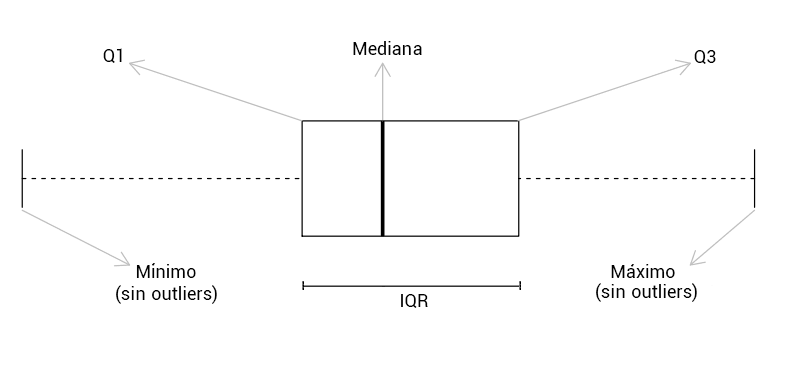

In [5]:
# Funcion para crear una tabla con los valores de BoxPlot
def get_box_plot_data(labels, bp):
    rows_list = []

    for i in range(len(labels)):
        dict1 = {}
        dict1['label'] = labels[i]
        dict1['cota inferior'] = bp['whiskers'][i*2].get_ydata()[1]
        dict1['primer cuartil (25%)'] = bp['boxes'][i].get_ydata()[1]
        dict1['mediana (50%)'] = bp['medians'][i].get_ydata()[1]
        dict1['tercer cuartil (75%)'] = bp['boxes'][i].get_ydata()[2]
        dict1['cota superior'] = bp['whiskers'][(i*2)+1].get_ydata()[1]
        rows_list.append(dict1)

    return pd.DataFrame(rows_list)

### _Tabla y gráfico de Boxplot_

In [6]:
labels = ["X"]
bp = plt.boxplot([df['X']], labels = labels)
plt.close()  #se cancela la muestra el grafico para que solo se muestre la tabla
get_box_plot_data(labels, bp)

,label,cota inferior,primer cuartil (25%),mediana (50%),tercer cuartil (75%),cota superior
0,X,-70.822441,-70.688593,-70.643117,-70.591146,-70.48242


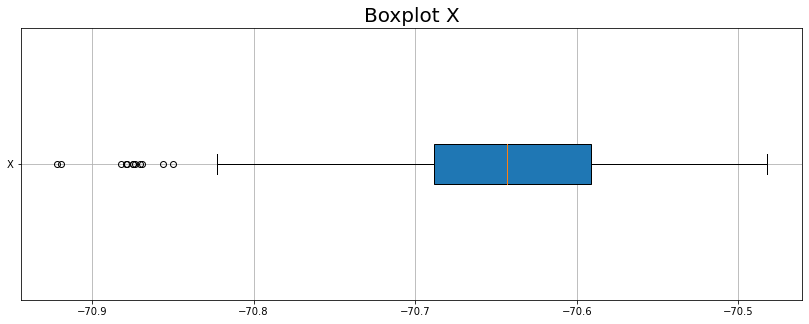

In [7]:
plt.figure(figsize=(14, 5))
plt.grid()
plt.title("Boxplot X", fontsize = 20)
plt.boxplot(df['X'], labels = ["X"], patch_artist=True, vert=False)
#plt.savefig('../graficos/BoxplotLong.jpg')
plt.show()

Se puede apreciar la presencia de valores outliers a la izquierda del gráfico. Se revisa la cantidad de registros a los que éstos corresponden y posteriormente se evalúa si es pertinenete eliminarlos.

In [8]:
# Se copian los registros a un nuevo dataset
df[df["X"] < -70.822441].shape

(13, 12)

Se puede apreciar que corresponde a un volumen muy pequeño de datos, por lo que no se va a borrar.

### _Tabla y gráfico de Boxplot_

In [9]:
labels = ["Y"]
bp = plt.boxplot([df['Y']], labels = labels)
plt.close()  #se cancela la muestra el grafico para que solo se muestre la tabla
get_box_plot_data(labels, bp)

,label,cota inferior,primer cuartil (25%),mediana (50%),tercer cuartil (75%),cota superior
0,Y,-33.648727,-33.519193,-33.454887,-33.424681,-33.284862


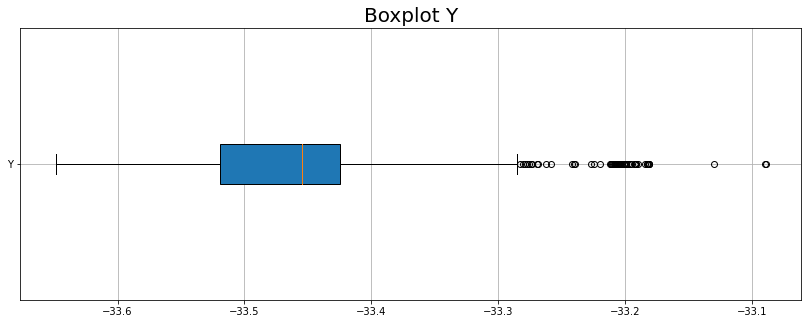

In [10]:
plt.figure(figsize=(14, 5))
plt.grid()
plt.title("Boxplot Y", fontsize = 20)
plt.boxplot(df['Y'], labels = ["Y"], patch_artist=True, vert=False)
#plt.savefig('../graficos/BoxplotLat.jpg')
plt.show()

In [11]:
df[df["Y"] > -33.284862].shape

(68, 12)

Al igual que el caso anterior, se puede apreciar que corresponde a un volumen muy pequeño de datos, por lo que no se eliminan del set de datos.

## Volumen de incidentes por año
Gráfico de torta para evaluar el número de incidentes por año

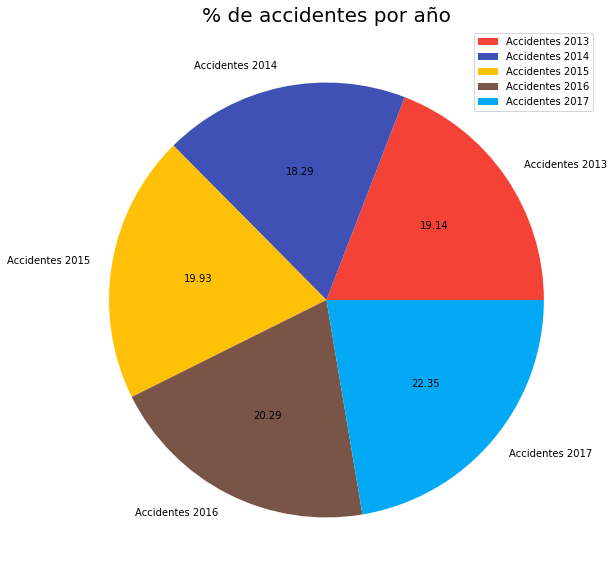

In [12]:
df_anio = df.groupby("Anio").agg({
    "Comuna": "count"
})
etiquetas = ["Accidentes 2013", "Accidentes 2014", "Accidentes 2015", "Accidentes 2016", "Accidentes 2017"]
colores = ["#f44336", "#3F51B5", "#FFC107", "#795548", "#03A9F4"]
explode = [0.0, 0.0, 0.0, 0.0, 0.0]
plt.figure(figsize=(18,10))
plt.pie(df_anio["Comuna"], labels= etiquetas, autopct="%.2f", explode=explode, colors = colores)
plt.legend(loc = "best")
plt.title("% de accidentes por año", fontsize = 20)
#plt.savefig("../graficos/Grafico_por_anio.jpg")
plt.show()

## Top 10 de comunas con mayor y menor número de accidentes entre los años 2013 y 2017
Se agrupan los datos en función de las comunas y se cuenta la catidad de accidentes que hay por cada una de éstas para obtener las 10 comunas con mayor número y menor número accidentes automovilísticos.

In [13]:
df_comunas = df.groupby("Comuna").agg({
    "Calle1": "count"
})
df_comunas = df_comunas.sort_values("Calle1", ascending = False)
df_comunas_top10 = df_comunas.head(10)
df_comunas_last10 = df_comunas.tail(10)
print("Listado de comunas con más accidentes")
print(df_comunas_top10)
print("--------------------------------------------------")
print("Listado de comunas con menos accidentes")
print(df_comunas_last10)

Listado de comunas con más accidentes
               Calle1
Comuna               
SANTIAGO          970
PUENTE ALTO       744
LAS CONDES        584
PROVIDENCIA       503
MAIPU             481
ÑUÑOA             395
LA FLORIDA        358
PEÑALOLEN         330
QUINTA NORMAL     310
PUDAHUEL          305
--------------------------------------------------
Listado de comunas con menos accidentes
               Calle1
Comuna               
SAN MIGUEL        131
INDEPENDENCIA     127
LO ESPEJO         105
HUECHURABA        104
COLINA             74
CERRILLOS          52
LAMPA              14
PADRE HURTADO       6
PIRQUE              5
TILTIL              3


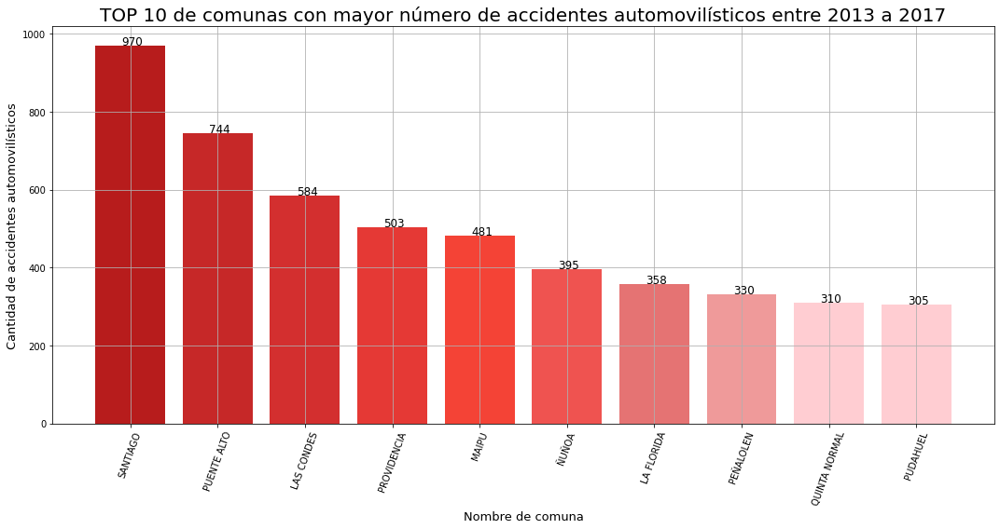

In [14]:
colores = ["#B71C1C","#C62828", "#D32F2F", "#E53935", "#F44336", "#EF5350", "#E57373", "#EF9A9A", "#FFCDD2", "#FFCDD2"]
plt.figure(figsize=(15,8))
plt.grid()
plt.bar(df_comunas_top10.index, df_comunas_top10["Calle1"], color = colores)
plt.xticks(rotation = 70)
plt.xlabel("Nombre de comuna", fontsize = 13)
plt.ylabel("Cantidad de accidentes automovilísticos", fontsize = 13)
plt.title("TOP 10 de comunas con mayor número de accidentes automovilísticos entre 2013 a 2017", fontsize = 20)
# Se muestra la cantidad por cada barra
for index,data in enumerate(df_comunas_top10["Calle1"]):
    plt.text(x = index-0.098, y = data + 2, s = f"{data}", fontdict=dict(fontsize = 12))
plt.tight_layout()
#plt.savefig("../graficos/Top10Comunas_mas_incidentes.jpg")
plt.show()

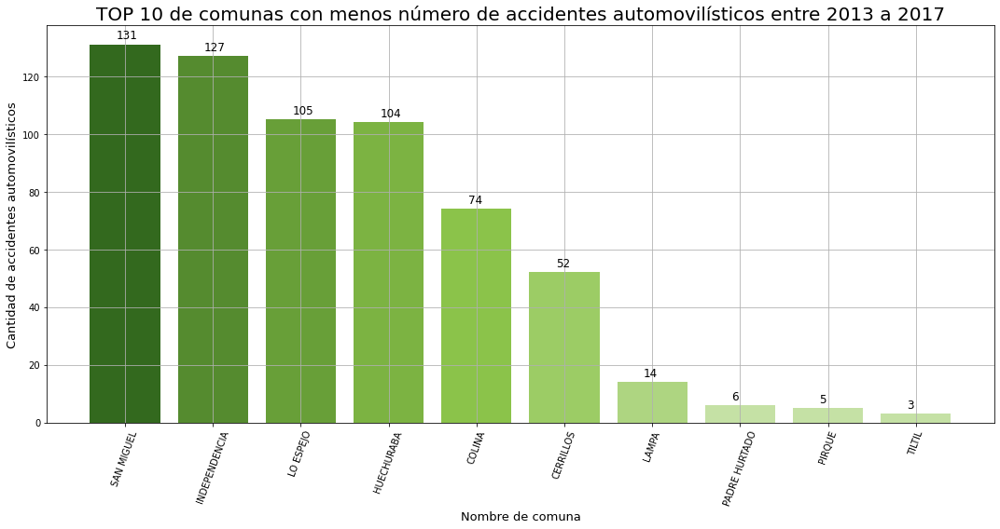

In [15]:
colores = ["#33691E", "#558B2F", "#689F38", "#7CB342", "#8BC34A", "#9CCC65", "#AED581", "#C5E1A5", "#C5E1A5", "#C5E1A5"]
plt.figure(figsize=(15,8))
plt.grid()
plt.bar(df_comunas_last10.index, df_comunas_last10["Calle1"], color = colores)
plt.xticks(rotation = 70)
plt.xlabel("Nombre de comuna", fontsize = 13)
plt.ylabel("Cantidad de accidentes automovilísticos", fontsize = 13)
plt.title("TOP 10 de comunas con menos número de accidentes automovilísticos entre 2013 a 2017", fontsize = 20)
# Se muestra la cantidad por cada barra
for index,data in enumerate(df_comunas_last10["Calle1"]):
    plt.text(x = index-0.098, y = data + 2, s = f"{data}", fontdict=dict(fontsize = 12))
plt.tight_layout()
#plt.savefig("../graficos/Top10Comunas_menos_incidentes.jpg")
plt.show()

## Relación entre accidentes que ocurrieron en intersecciones respecto a los que no
Se agrupan los datos en función de la columna "Intersección" y se cuenta la cantidad de registros por cada grupo para mostrarlos en un gráfico de torta.

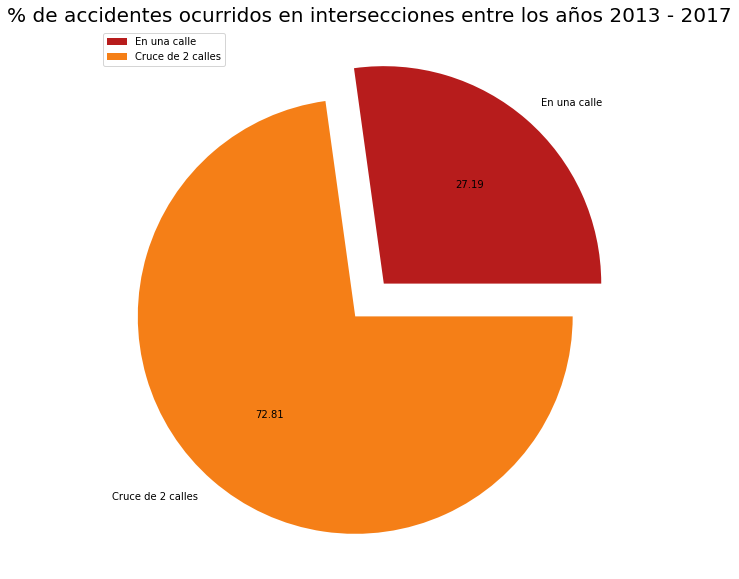

In [16]:
df_intersec = df.groupby("Interseccion").agg({
    "Calle1": "count"
})
etiquetas = ["En una calle", "Cruce de 2 calles"]
colores = ["#B71C1C", "#F57F17"]
explode = [0.1, 0.1]
plt.figure(figsize=(18,10))
plt.pie(df_intersec["Calle1"], labels= etiquetas, autopct="%.2f", explode=explode, colors = colores)
plt.legend(loc = "best")
plt.title("% de accidentes ocurridos en intersecciones entre los años 2013 - 2017", fontsize = 20)
#plt.savefig("../graficos/Accidentes_intersecciones.jpg")
plt.show()

## Top 10 de calles con mayor número de accidentes
Las 10 calles que tienen mayor número de accidentes automovilísticos en la Región Metropolitana

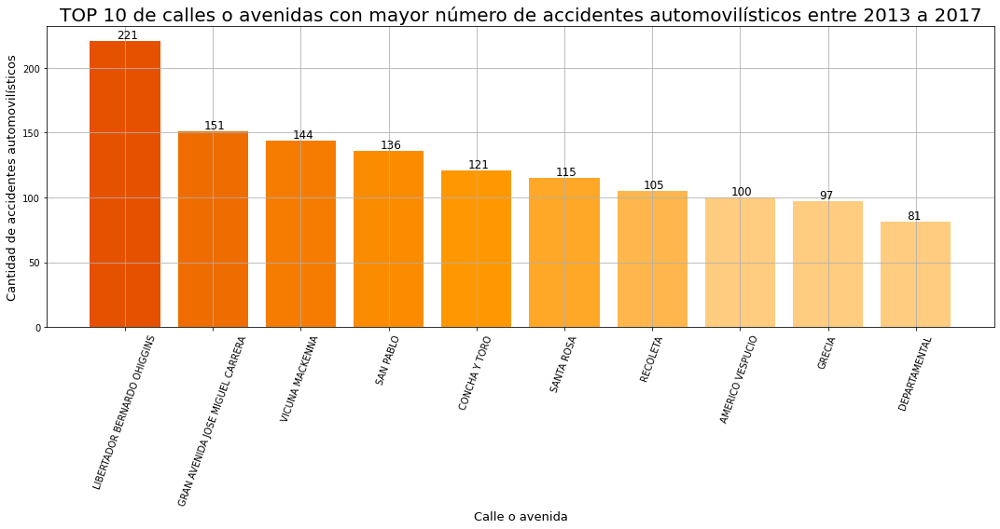

In [17]:
df_calle = df_intersec = df.groupby("Calle1").agg({
    "Comuna": "count"
})
df_calle = df_calle.sort_values("Comuna", ascending = False).head(10)
colores = ["#E65100", "#EF6C00", "#F57C00", "#FB8C00", "#FF9800", "#FFA726", "#FFB74D", "#FFCC80", "#FFCC80", "#FFCC80"]
plt.figure(figsize=(15,8))
plt.grid()
plt.bar(df_calle.index, df_calle["Comuna"], color = colores)
plt.xticks(rotation = 70)
plt.xlabel("Calle o avenida", fontsize = 13)
plt.ylabel("Cantidad de accidentes automovilísticos", fontsize = 13)
plt.title("TOP 10 de calles o avenidas con mayor número de accidentes automovilísticos entre 2013 a 2017", fontsize = 20)
# Se muestra la cantidad por cada barra
for index,data in enumerate(df_calle["Comuna"]):
    plt.text(x = index-0.098, y = data + 2, s = f"{data}", fontdict=dict(fontsize = 12))
plt.tight_layout()
#plt.savefig("../graficos/Top10Calles_mas_incidentes.jpg")
plt.show()

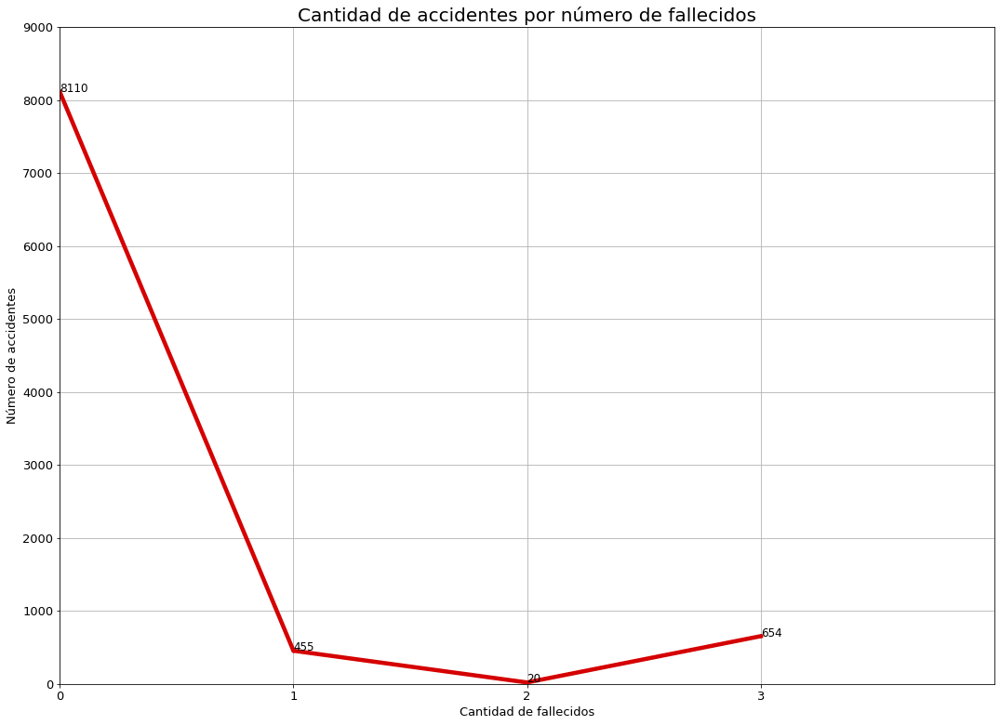

            Calle1
Fallecidos        
0             8110
1              455
2               20
3              654


In [18]:
dfFalledicos = df.groupby("Fallecidos").agg({
    "Calle1" : "count"
})

plt.figure(figsize=(18,13))
plt.grid()
plt.title("Cantidad de accidentes por número de fallecidos", fontsize = 20)
plt.xlabel("Cantidad de fallecidos", fontsize=13)
plt.ylabel("Número de accidentes", fontsize=13)

plt.xlim(0, 4)
plt.ylim(0, 9000)

plt.yticks(fontsize = 13)
plt.xticks(np.arange(0, 4, 1), fontsize = 13)

plt.plot(dfFalledicos.index, dfFalledicos["Calle1"], marker=".", linewidth=4.5, c = "#D50000")

for index,data in enumerate(dfFalledicos["Calle1"]):
    plt.text(x = index, y = data, s = f"{data}", fontdict=dict(fontsize = 12))
#plt.savefig("../graficos/NumAccidentes_NumFallecidos.jpg")
plt.show()
print(dfFalledicos)

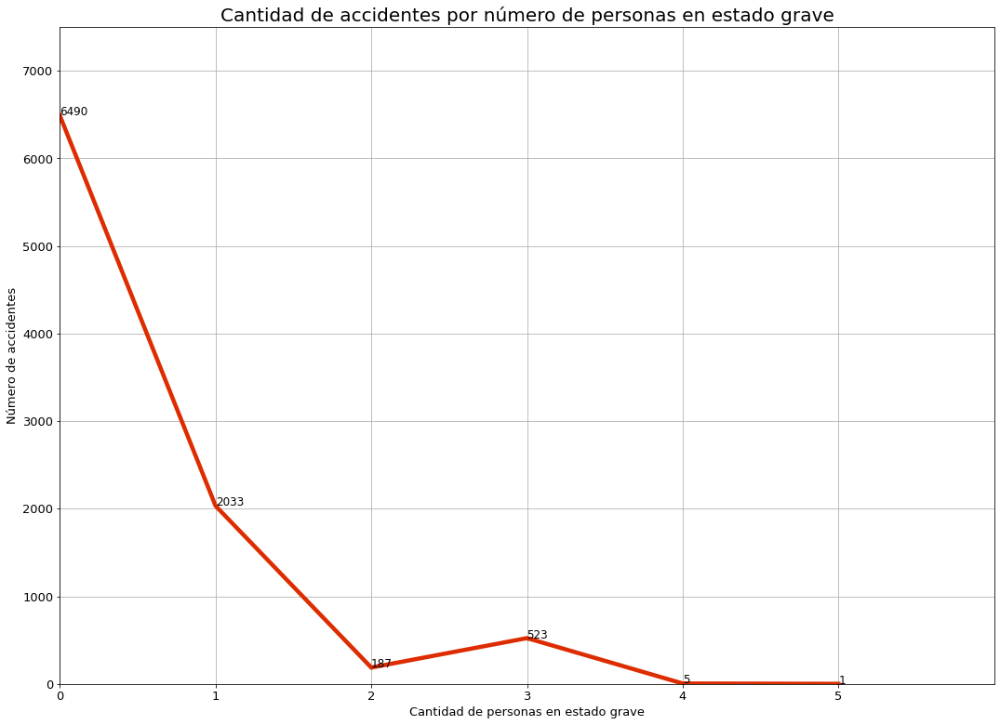

        Calle1
Graves        
0         6490
1         2033
2          187
3          523
4            5
5            1


In [19]:
dfGraves = df.groupby("Graves").agg({
    "Calle1" : "count"
})
plt.figure(figsize=(18,13))
plt.grid()
plt.title("Cantidad de accidentes por número de personas en estado grave", fontsize = 20)
plt.xlabel("Cantidad de personas en estado grave", fontsize=13)
plt.ylabel("Número de accidentes", fontsize=13)

plt.xlim(0, 6)
plt.ylim(0, 7500)

plt.yticks(fontsize = 13)
plt.xticks(np.arange(0, 6, 1), fontsize = 13)

plt.plot(dfGraves.index, dfGraves["Calle1"], marker=".", linewidth=4.5, c = "#DD2C00")

for index,data in enumerate(dfGraves["Calle1"]):
    plt.text(x = index, y = data, s = f"{data}", fontdict=dict(fontsize = 12))
#plt.savefig("../graficos/NumAccidentes_NumGrave.jpg")
plt.show()
print(dfGraves)

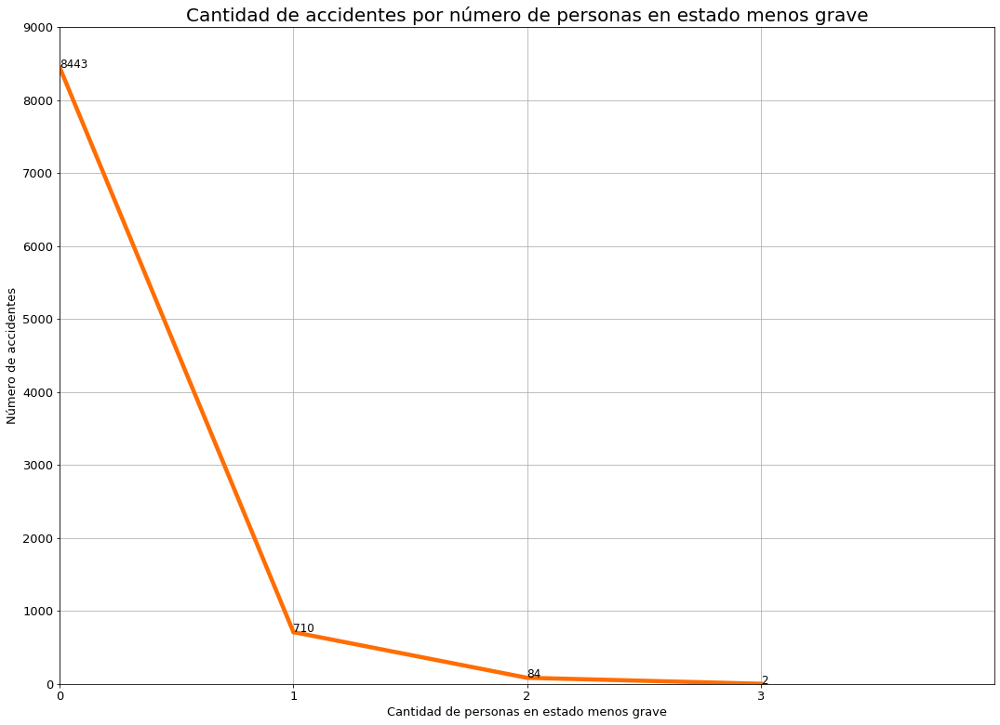

             Calle1
MenosGraves        
0              8443
1               710
2                84
3                 2


In [21]:
dfMenosGrav = df.groupby("MenosGraves").agg({
    "Calle1" :"count"
})
plt.figure(figsize=(18,13))
plt.grid()
plt.title("Cantidad de accidentes por número de personas en estado menos grave", fontsize = 20)
plt.xlabel("Cantidad de personas en estado menos grave", fontsize=13)
plt.ylabel("Número de accidentes", fontsize=13)

plt.xlim(0, 4)
plt.ylim(0, 9000)

plt.yticks(fontsize = 13)
plt.xticks(np.arange(0, 4, 1), fontsize = 13)

plt.plot(dfMenosGrav.index, dfMenosGrav["Calle1"], marker=".", linewidth=4.5, c = "#FF6D00")

for index,data in enumerate(dfMenosGrav["Calle1"]):
    plt.text(x = index, y = data, s = f"{data}", fontdict=dict(fontsize = 12))
#plt.savefig("../graficos/NumAccidentes_NumMenosGrave.jpg")
plt.show()
print(dfMenosGrav)

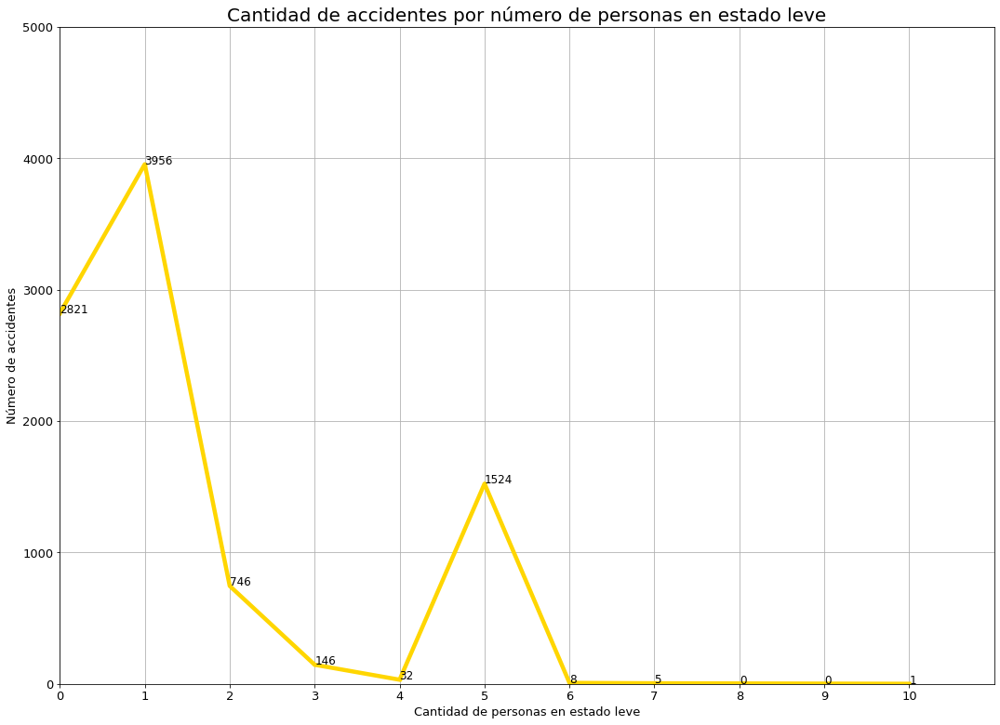

       Calle1
Leves        
0        2821
1        3956
2         746
3         146
4          32
5        1524
6           8
7           5
10          1


In [13]:
dfLeves = df.groupby("Leves").agg({
    "Calle1" : "count"
})
plt.figure(figsize=(18,13))
plt.grid()
plt.title("Cantidad de accidentes por número de personas en estado leve", fontsize = 20)
plt.xlabel("Cantidad de personas en estado leve", fontsize=13)
plt.ylabel("Número de accidentes", fontsize=13)

plt.xlim(0, 11)
plt.ylim(0, 5000)

plt.yticks(fontsize = 13)
plt.xticks(np.arange(0, 11, 1), fontsize = 13)

plt.plot(dfLeves.index, dfLeves["Calle1"], marker=".", linewidth=4.5, c = "#FFD600")

for index,data in enumerate(dfLeves["Calle1"]):
    if(index == 8):
        # Ultimo valor
        plt.text(x = index + 2, y = data, s = f"{data}", fontdict=dict(fontsize = 12))
        # Valores intermedios
        plt.text(x = 9, y = 0, s = f"0", fontdict=dict(fontsize = 12))
        plt.text(x = 8, y = 0, s = f"0", fontdict=dict(fontsize = 12))
    else:
        plt.text(x = index, y = data, s = f"{data}", fontdict=dict(fontsize = 12))
#plt.savefig("../graficos/NumAccidentes_NumLeves.jpg")
plt.show()
print(dfLeves)

## Mapas de calor y clustering por año de accidente automovilístico
A continuación se presentan mapas de calor y clústering para identificar aquellas zonas donde hay mayor presencia de accidentes automovilísticos por cada año de información. Estos mapas fueron desarrollados almacenando la inforamción en una base de datos SQL Server, la cual se integró mediante una aplicación web desarrolada con .NET Core 3.1 integrada a la API ArcGIS 4.6 para visualización de mapas geoespaciales.

## Año 2013 (Heat map)

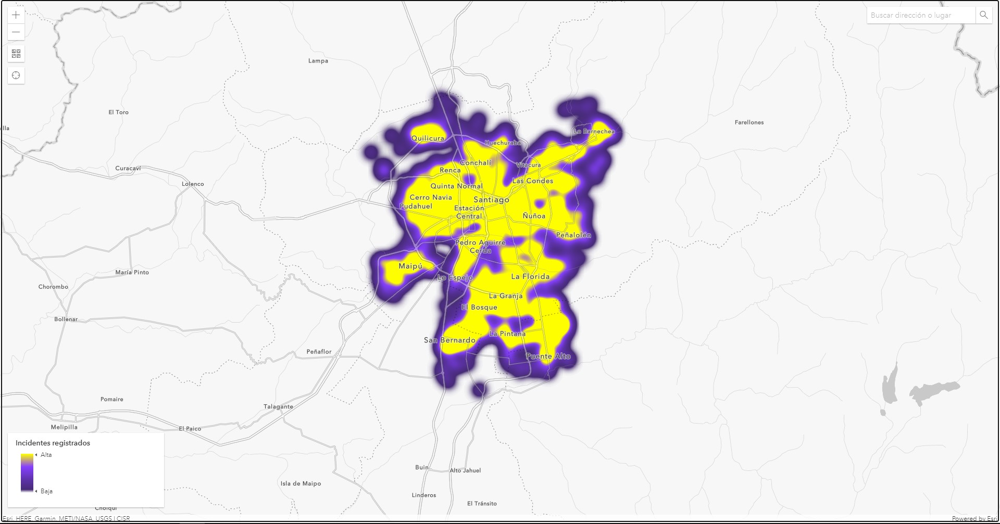

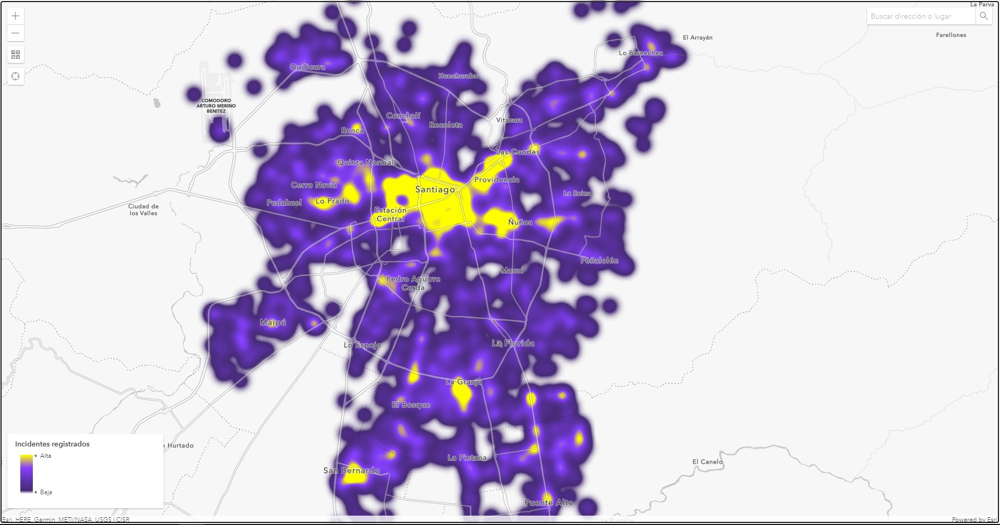

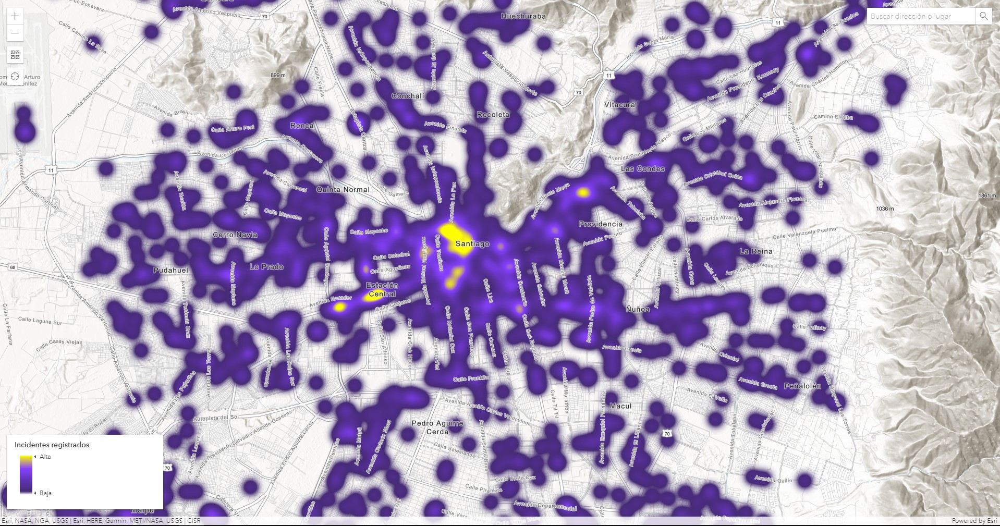

## Año 2014 (heat map)

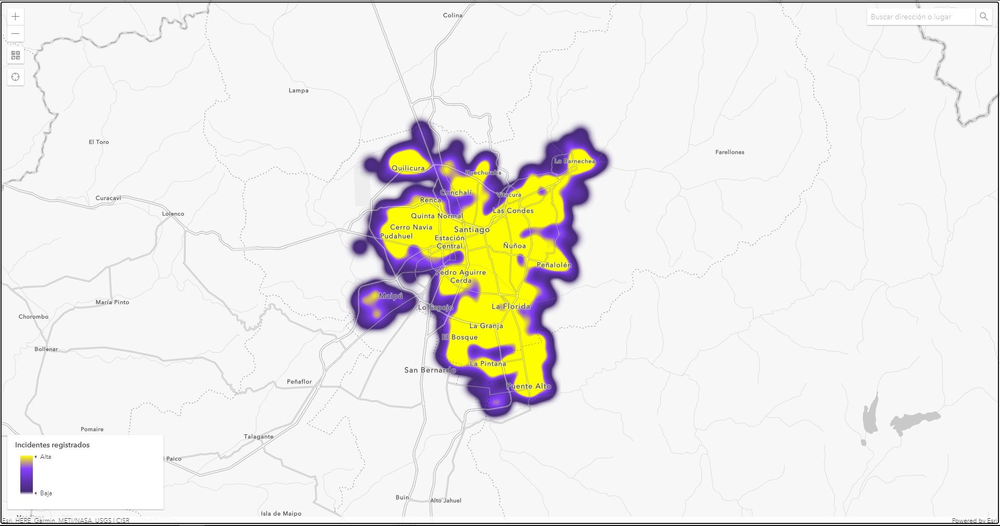

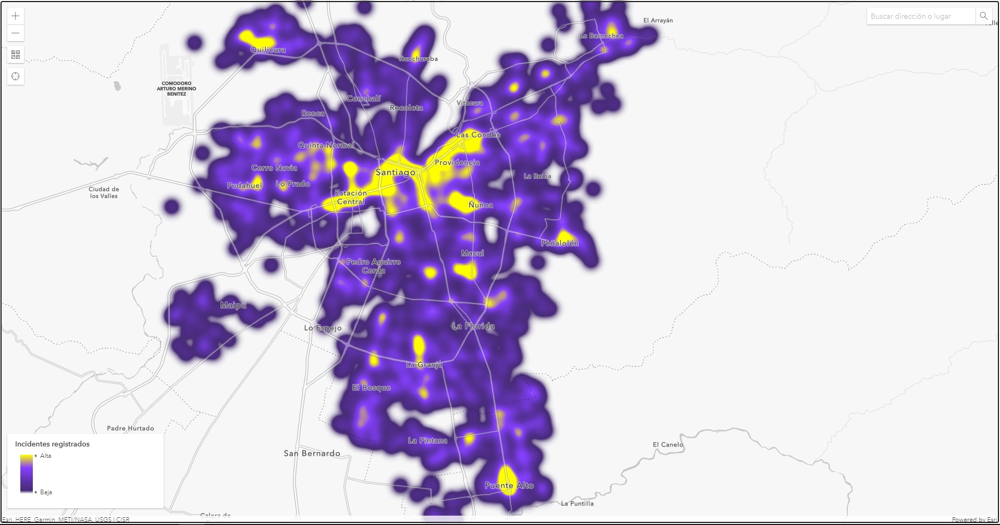

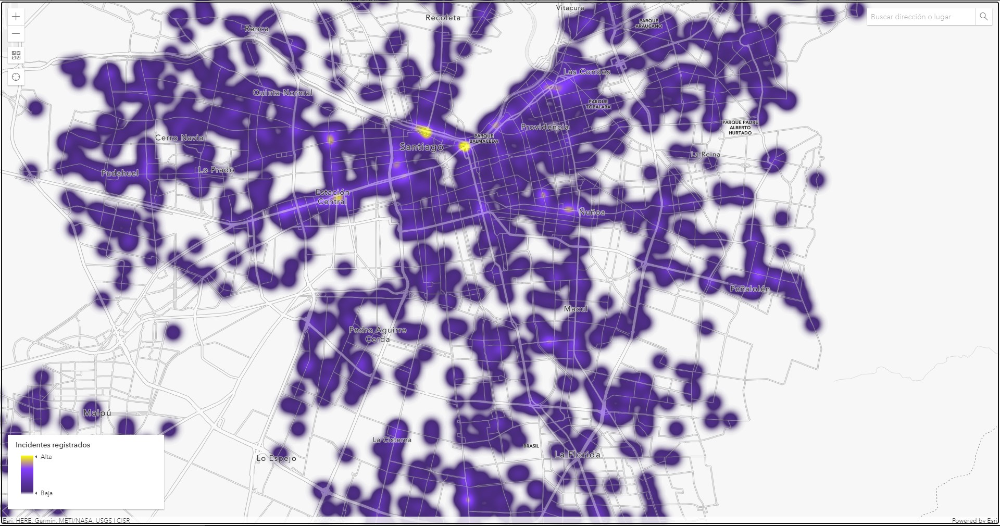

## Año 2015 (heat map)

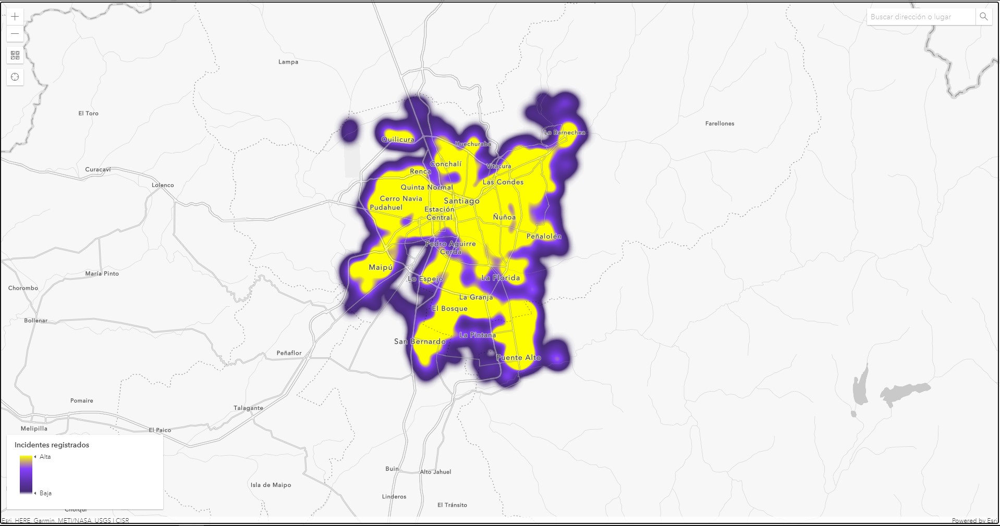

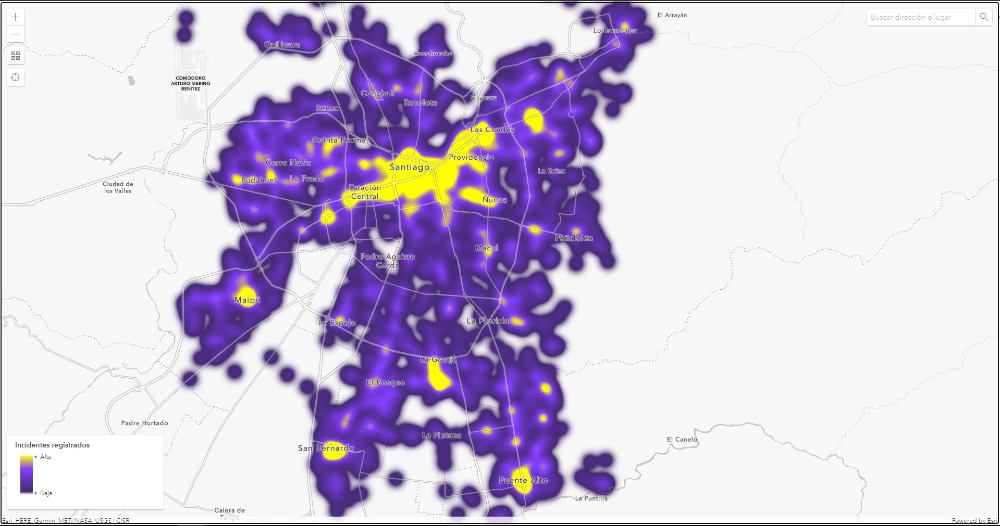

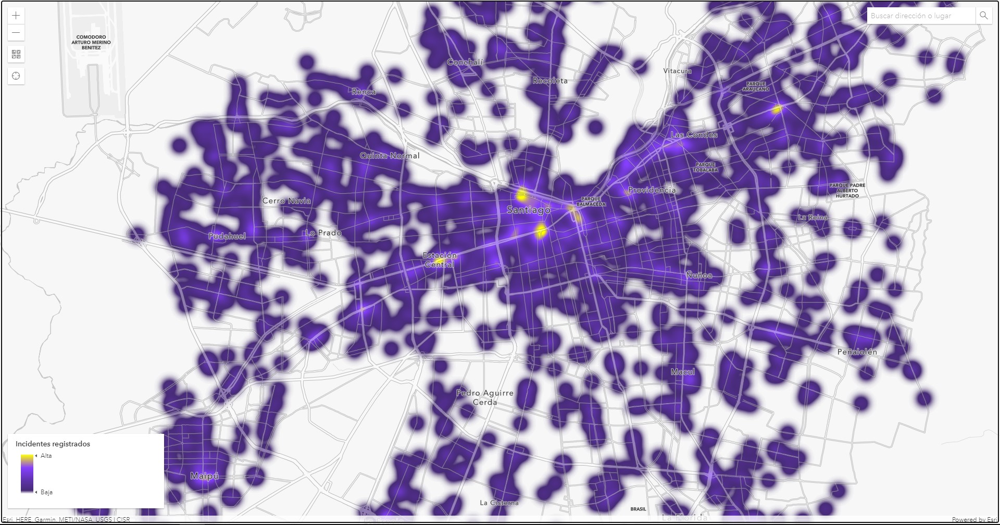

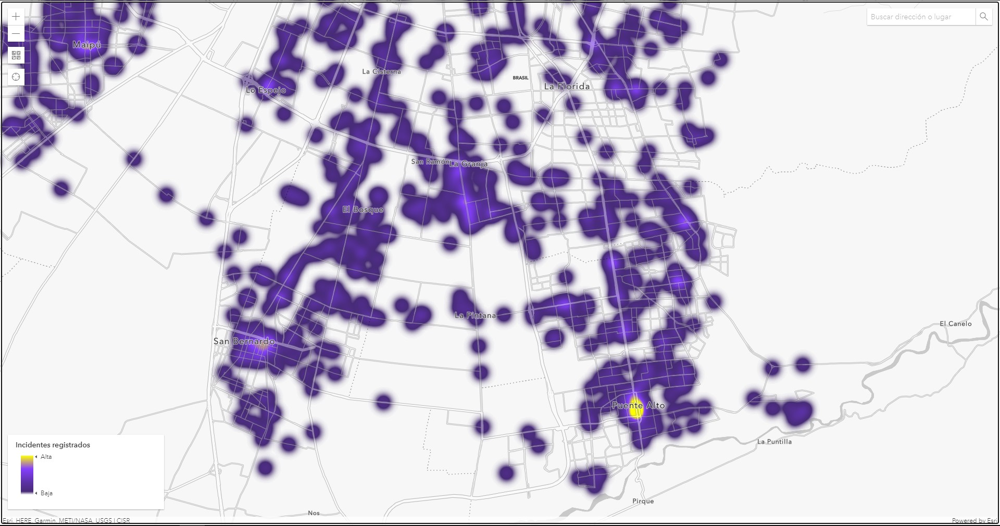

## Año 2016 (heat map)

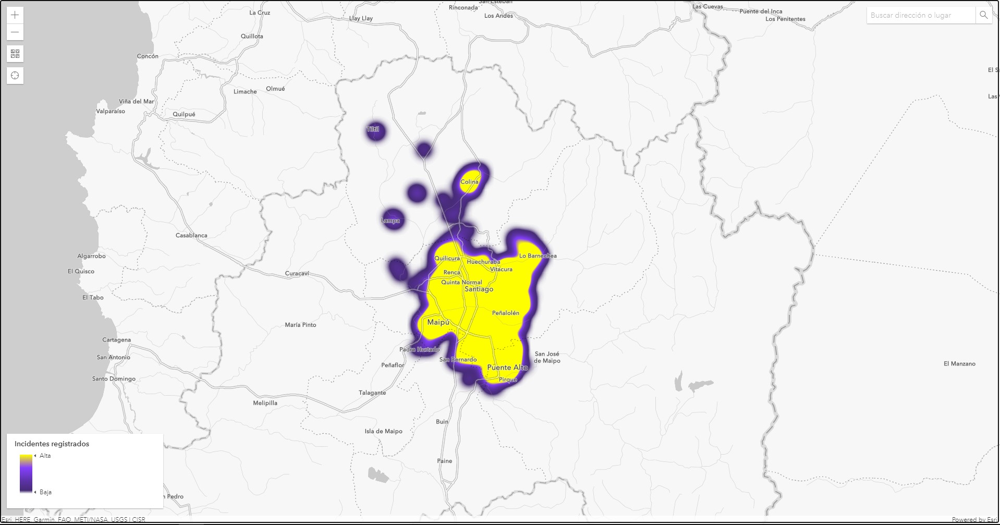

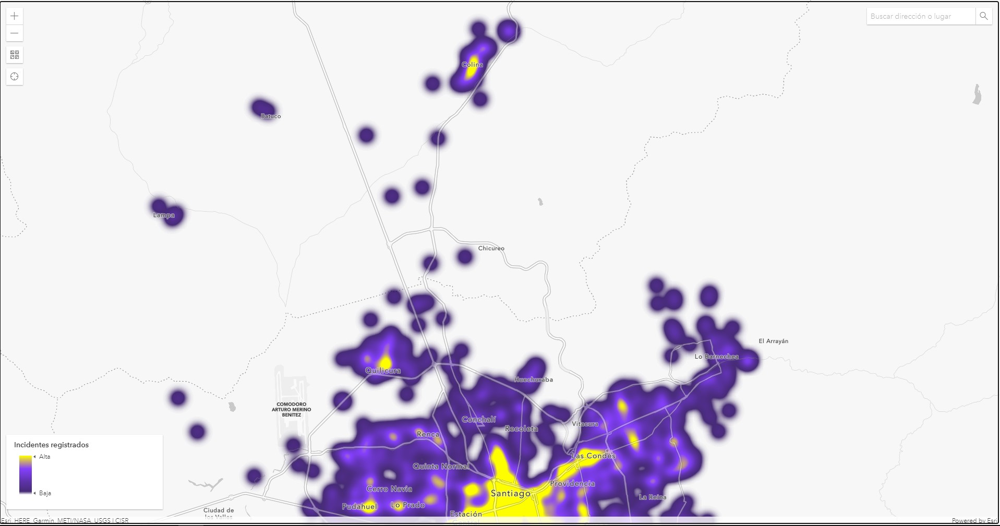

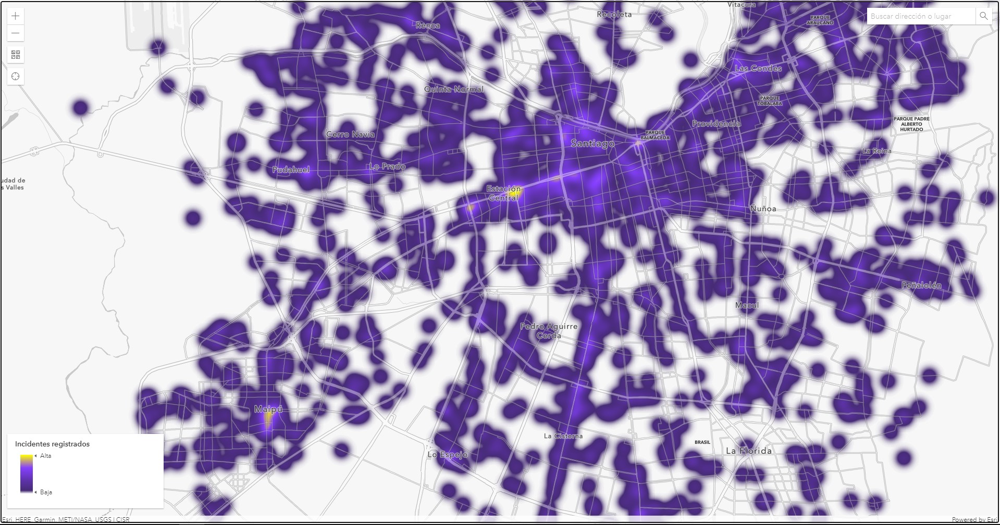

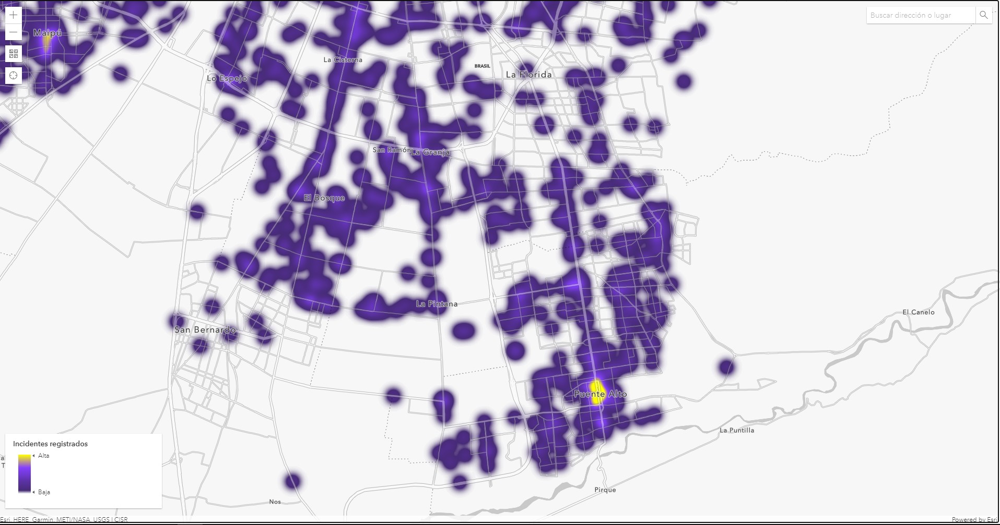

## Año 2017 (heat map)

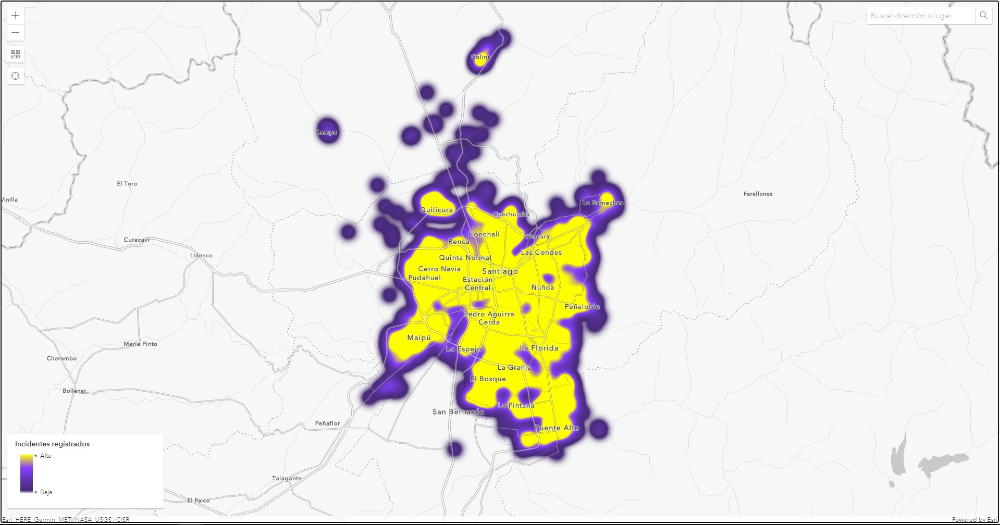

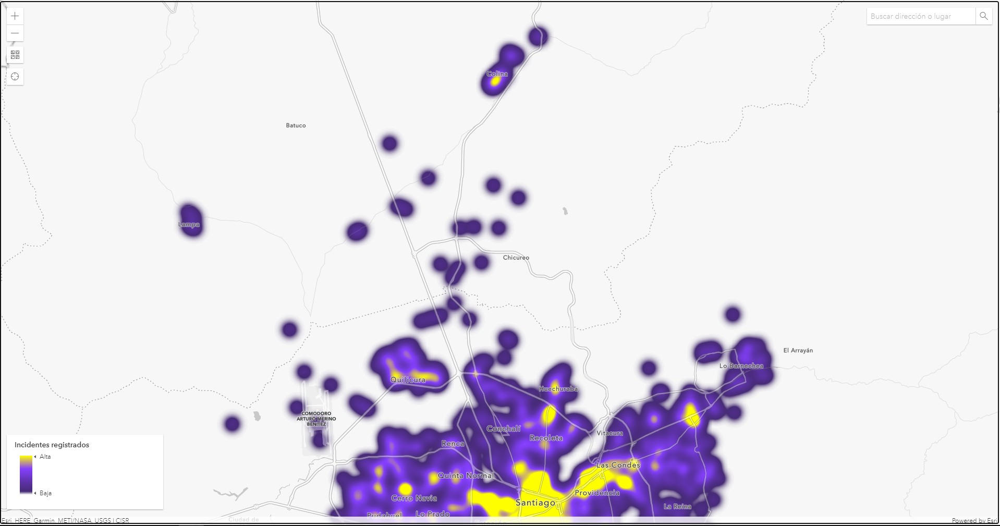

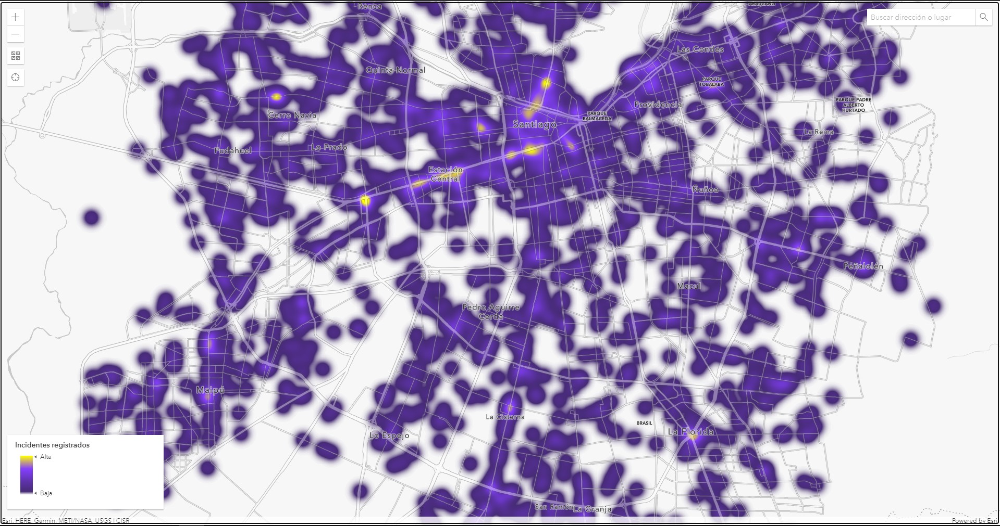

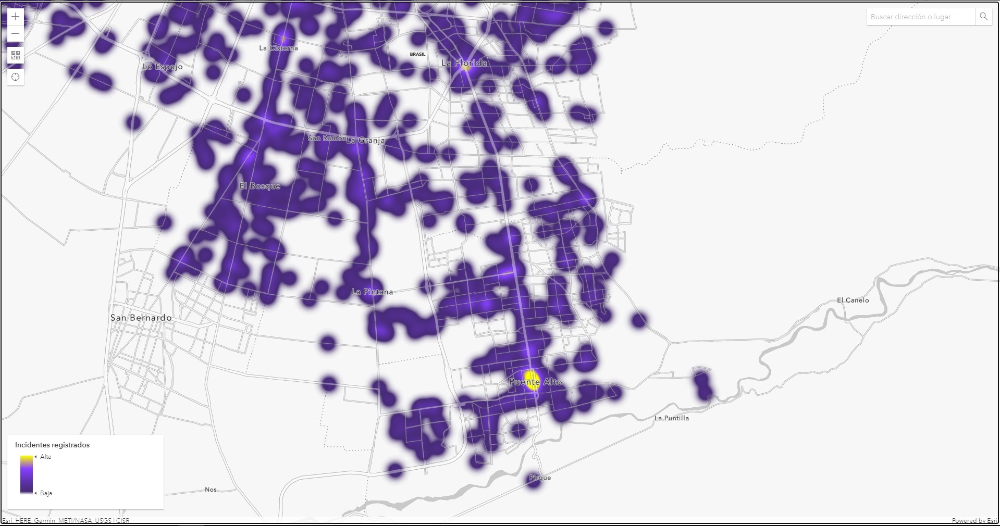

## Mapas de calor asociado a todos los accidentes (2013 - 2017)

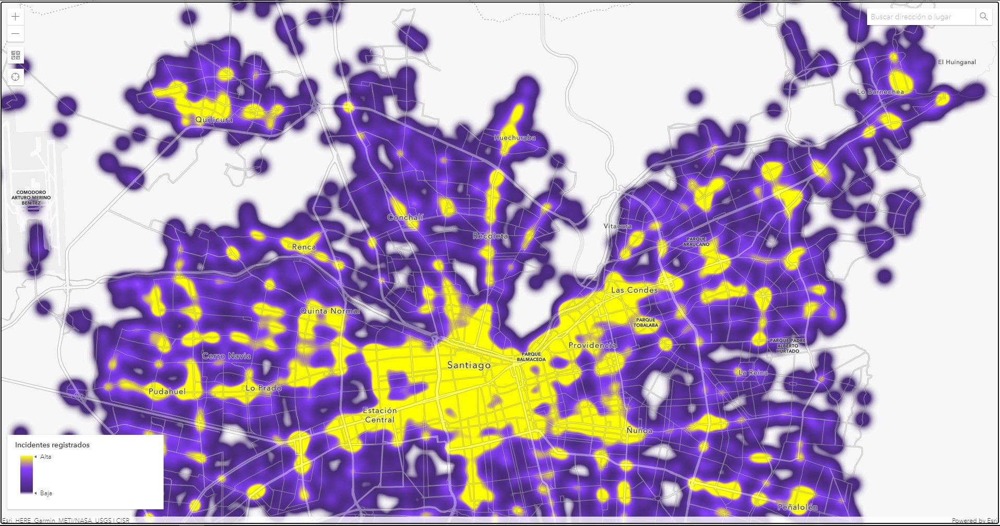

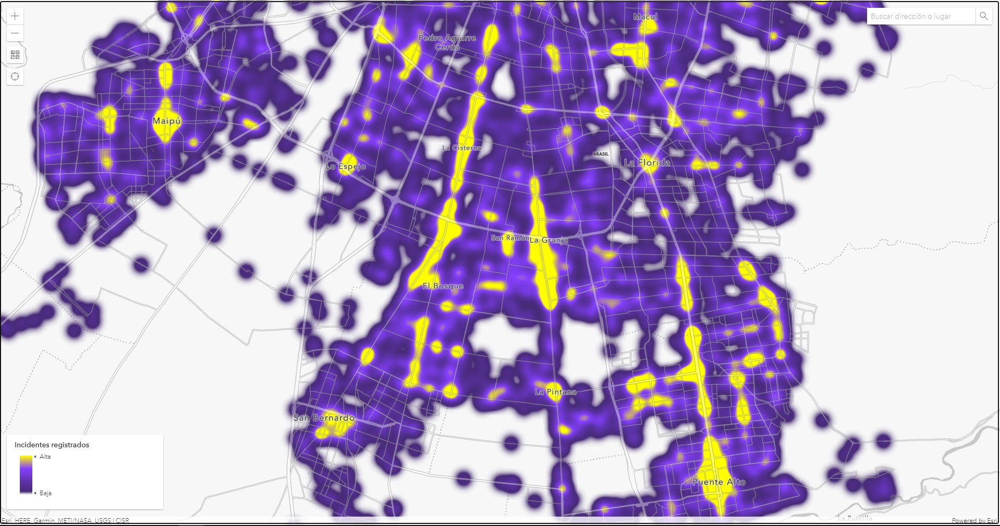

## Clustering accidentes 2013

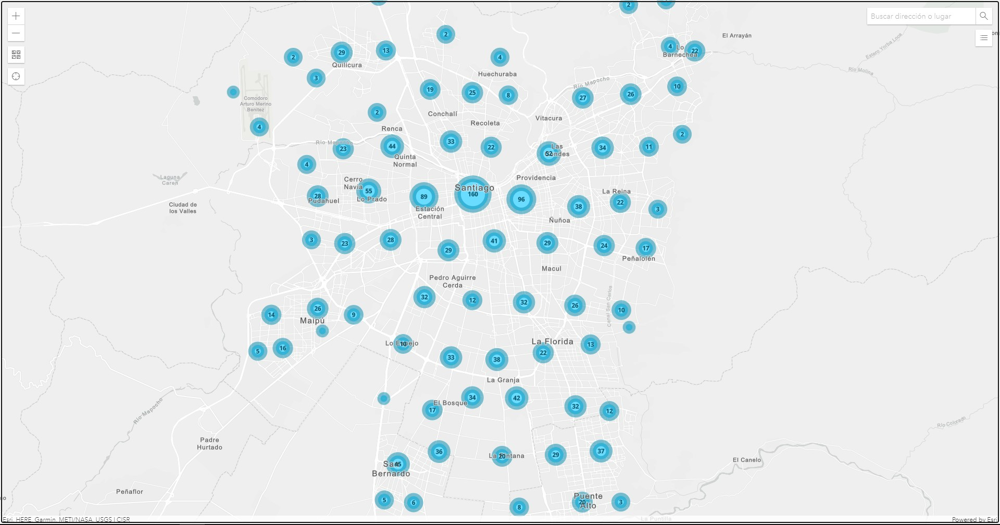

## Clustering 2014

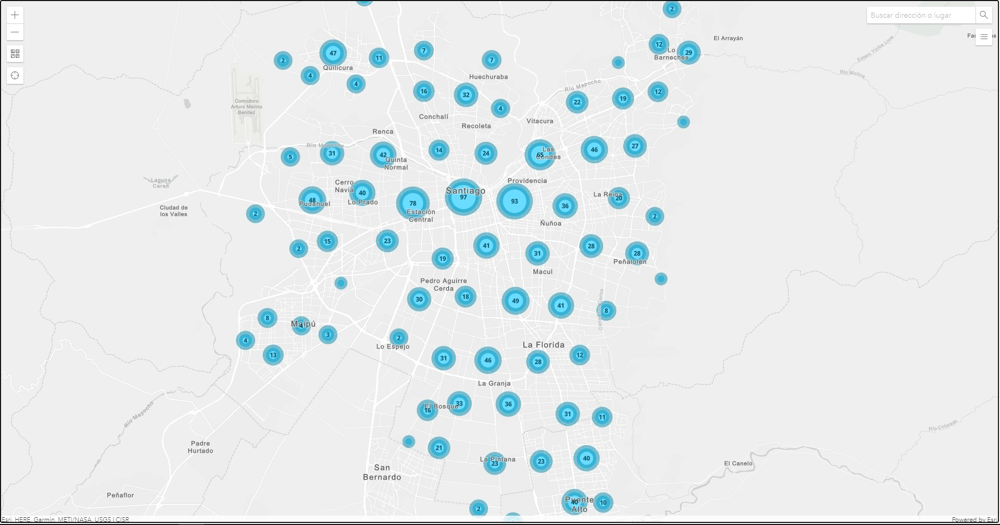

## Clustering 2015

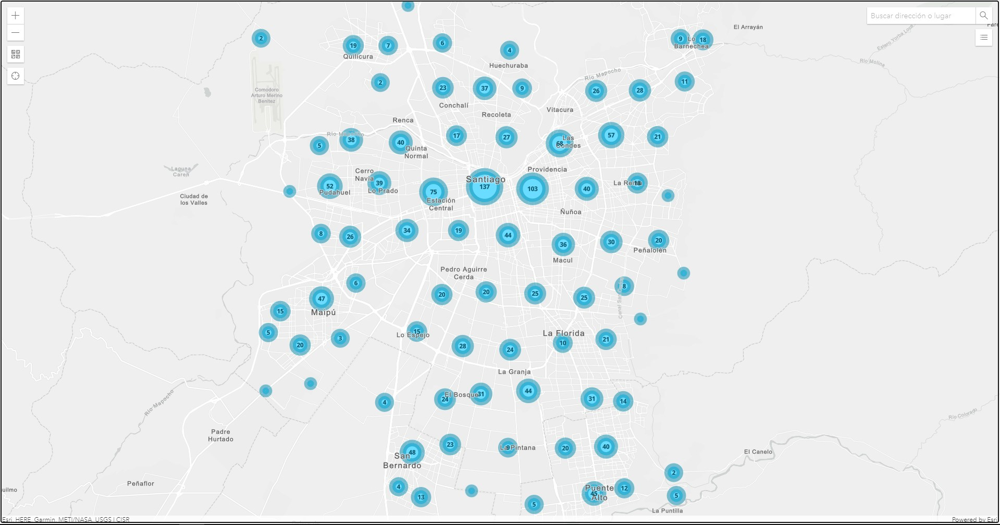

## Clustering 2016

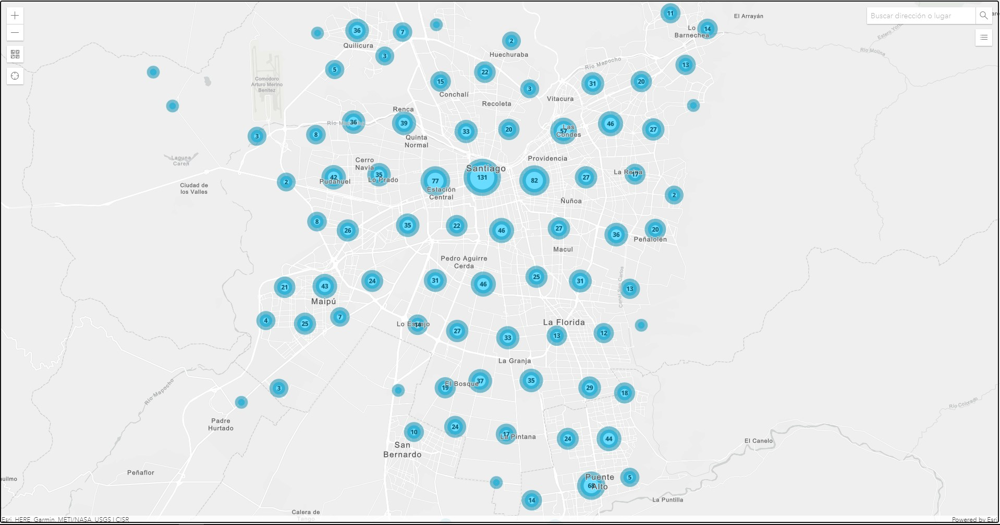

## Clustering 2017

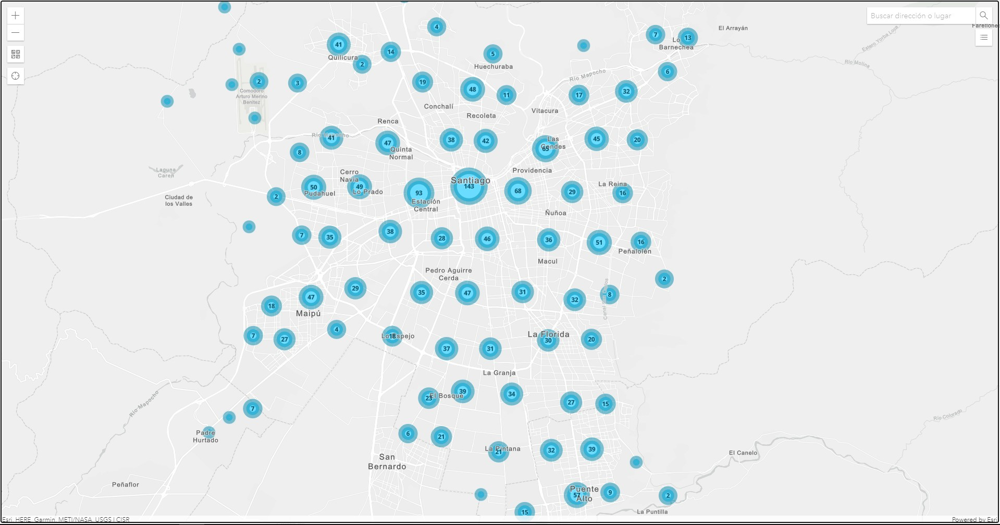

## Clustering asociado a todos los accidentes (2013 - 2017)

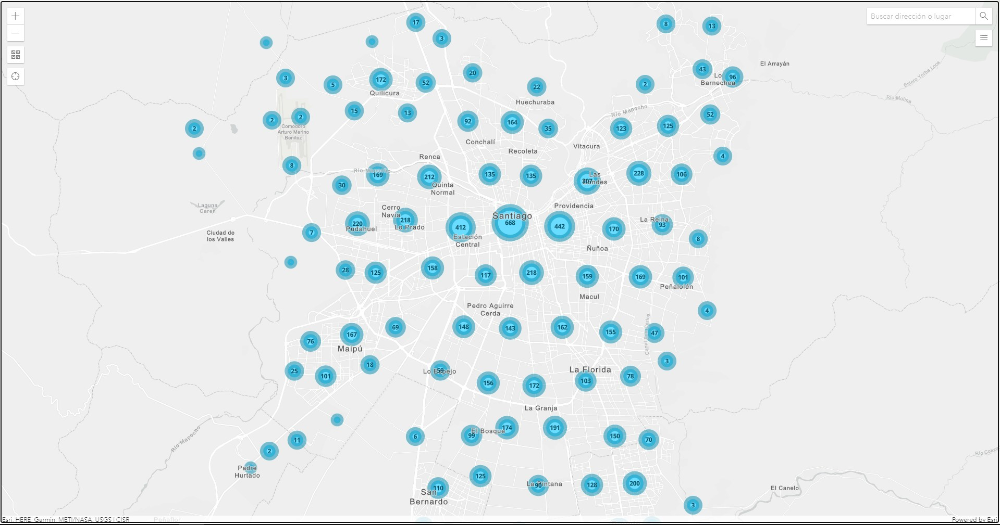

## Fallo en punto de ubicación

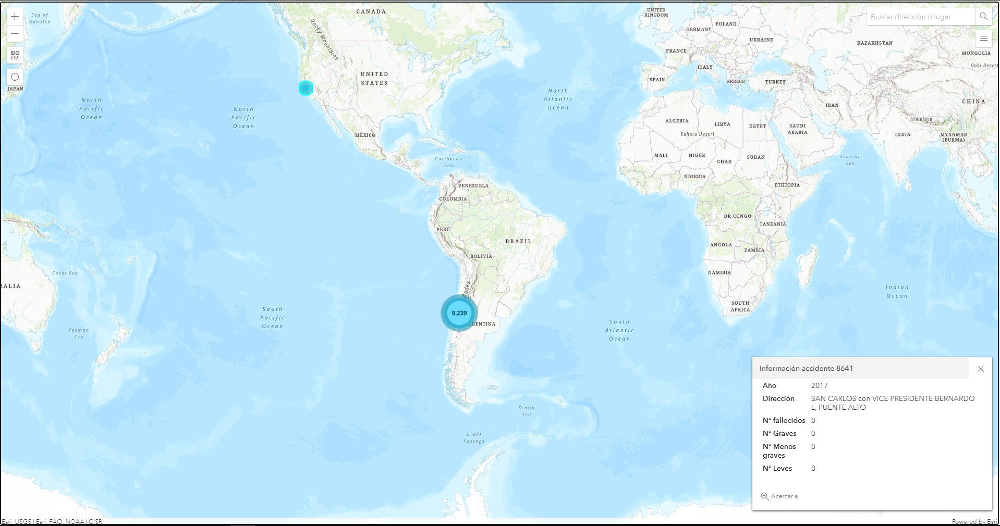